<a href="https://colab.research.google.com/github/MAvRK7/MAvRK7-Perceptually-Aware-Image-Enhancement-with-Deep-Residual-U-Net-and-PatchGANs/blob/main/image_proj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Downloading the DIV 2K data set and importing libraries

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!kaggle datasets download -d joe1995/div2k-dataset

Dataset URL: https://www.kaggle.com/datasets/joe1995/div2k-dataset
License(s): unknown
100% 3.71G/3.71G [03:23<00:00, 19.3MB/s]
100% 3.71G/3.71G [03:23<00:00, 19.5MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/div2k-dataset.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, LeakyReLU, BatchNormalization, Concatenate, Add, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tqdm import tqdm

This function creates a generator model that uses a U-Net-like design with residual connections. It has an encoder-decoder structure that captures important features while keeping spatial details through skip connections. The final output is combined with the input to improve image generation and maintain better detail.


In [ ]:
# Improved generator model (U-Net-like structure with residual connections)
def build_generator():
    inputs = Input(shape=(256, 256, 3))

    # Encoder
    e1 = Conv2D(64, 3, padding='same')(inputs)
    e1 = LeakyReLU(0.2)(e1)
    e2 = Conv2D(128, 3, strides=2, padding='same')(e1)
    e2 = BatchNormalization()(e2)
    e2 = LeakyReLU(0.2)(e2)
    e3 = Conv2D(256, 3, strides=2, padding='same')(e2)
    e3 = BatchNormalization()(e3)
    e3 = LeakyReLU(0.2)(e3)
    e4 = Conv2D(512, 3, strides=2, padding='same')(e3)
    e4 = BatchNormalization()(e4)
    e4 = LeakyReLU(0.2)(e4)

    # Bottleneck
    b = Conv2D(512, 3, padding='same')(e4)
    b = BatchNormalization()(b)
    b = LeakyReLU(0.2)(b)

    # Decoder with skip connections
    d4 = Conv2DTranspose(256, 3, strides=2, padding='same')(b)
    d4 = Concatenate()([d4, e3])
    d4 = BatchNormalization()(d4)
    d4 = LeakyReLU(0.2)(d4)
    d3 = Conv2DTranspose(128, 3, strides=2, padding='same')(d4)
    d3 = Concatenate()([d3, e2])
    d3 = BatchNormalization()(d3)
    d3 = LeakyReLU(0.2)(d3)
    d2 = Conv2DTranspose(64, 3, strides=2, padding='same')(d3)
    d2 = Concatenate()([d2, e1])
    d2 = BatchNormalization()(d2)
    d2 = LeakyReLU(0.2)(d2)

    # Final convolution
    outputs = Conv2D(3, 3, padding='same', activation='tanh')(d2)

    # Residual connection
    enhanced = Add()([inputs, outputs])
    enhanced = Lambda(lambda x: tf.clip_by_value(x, -1, 1))(enhanced)

    return Model(inputs, enhanced, name='generator')

This section defines two models: an improved discriminator using a PatchGAN approach and a perceptual loss model based on VGG16. The discriminator analyzes input images to distinguish between real and generated images through multiple convolutional layers. The perceptual model extracts features from a pre-trained VGG16 network, specifically from the 'block3_conv3' layer, which is used for calculating perceptual loss. Finally, the generator, discriminator, and perceptual models are instantiated, with the perceptual model set to non-trainable.


In [ ]:
# Improved discriminator model (PatchGAN)
def build_discriminator():
    inputs = Input(shape=(256, 256, 3))
    x = Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(128, 4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(256, 4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(512, 4, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(1, 4, strides=1, padding='same')(x)
    return Model(inputs, x, name='discriminator')

# Perceptual loss model
def build_perceptual_model():
    vgg = VGG16(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
    return Model(vgg.input, vgg.get_layer('block3_conv3').output)

# Build models
generator = build_generator()
discriminator = build_discriminator()
perceptual_model = build_perceptual_model()
perceptual_model.trainable = False

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


This part sets up the optimizers and loss functions for the models. The Adam optimizer is used for both the generator and discriminator with a learning rate of 0.0002 and beta_1 set to 0.5. For the loss functions, binary cross-entropy is used for the discriminator, while mean squared error is used for evaluating the generator.

Additionally, there are functions for loading and preprocessing images. The `load_and_preprocess_image` function reads an image file, decodes it, and resizes it to 256x256 pixels. The `augment` function applies random transformations like flipping, brightness adjustments, and contrast changes to enhance the dataset. Finally, the `normalize` and `denormalize` functions adjust the pixel values to a range suitable for training and convert them back to the original range, respectively.


In [ ]:
# Optimizers
g_optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
d_optimizer = Adam(learning_rate=0.0002, beta_1=0.5)

# Loss functions
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
mse = tf.keras.losses.MeanSquaredError()

# Data loading and augmentation
def load_and_preprocess_image(file_path):
    image = tf.io.read_file(file_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, [256, 256])
    return image

def augment(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    return image

def normalize(image):
    return (tf.cast(image, tf.float32) / 127.5) - 1

def denormalize(image):
    return (image + 1) * 127.5

This section creates a dataset for training the models. It loads high-resolution images from the specified directory and normalizes them for processing. The training data is shuffled and batched for efficient training.

The `train_step` function defines the training process for one step, where both the generator and discriminator are updated. It generates fake images from real ones, computes the loss for both models, and applies gradients to update their weights.

A training loop runs for a specified number of epochs. During each epoch, it iterates through the dataset, calls the `train_step` function, and displays the losses for both models. Every ten epochs, the models are saved to disk.

Finally, there is a function `enhance_image` that allows for enhancing a single image. It loads, normalizes, and processes the image, then uses the generator to produce an enhanced version, which is then denormalized and returned as a NumPy array. An example usage is provided to demonstrate how to save the enhanced image.


In [ ]:
# Create dataset
train_data_path = "/content/DIV2K_train_HR"
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_data_path,
    label_mode=None,
    batch_size=8,
    image_size=(256, 256),
    seed=1337,
    shuffle=True
)

train_ds = train_ds.map(lambda x: (normalize(x), normalize(x)))

# Training step
@tf.function
def train_step(real_images):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate fake images
        fake_images = generator(real_images, training=True)

        # Discriminator loss
        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(fake_images, training=True)
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        d_loss = real_loss + fake_loss

        # Generator loss
        g_loss_gan = cross_entropy(tf.ones_like(fake_output), fake_output)
        g_loss_l1 = mse(real_images, fake_images)
        g_loss_perceptual = mse(perceptual_model(real_images), perceptual_model(fake_images))
        g_loss = g_loss_gan + 100 * g_loss_l1 + 0.1 * g_loss_perceptual

    # Compute gradients
    d_gradients = disc_tape.gradient(d_loss, discriminator.trainable_variables)
    g_gradients = gen_tape.gradient(g_loss, generator.trainable_variables)

    # Apply gradients
    d_optimizer.apply_gradients(zip(d_gradients, discriminator.trainable_variables))
    g_optimizer.apply_gradients(zip(g_gradients, generator.trainable_variables))

    return d_loss, g_loss

# Training loop
num_epochs = 25
for epoch in range(num_epochs):
    progress_bar = tqdm(train_ds, desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch')
    for batch in progress_bar:
        d_loss, g_loss = train_step(batch[0])
        progress_bar.set_postfix({'D_loss': f'{d_loss.numpy():.4f}', 'G_loss': f'{g_loss.numpy():.4f}'})

    print(f'Epoch {epoch+1}/{num_epochs}')
    print(f'Discriminator loss: {d_loss.numpy():.4f}')
    print(f'Generator loss: {g_loss.numpy():.4f}')

    # Save models
    if (epoch + 1) % 10 == 0:
        generator.save(f'generator_epoch_{epoch+1}.keras')
        discriminator.save(f'discriminator_epoch_{epoch+1}.keras')

# Function to enhance a single image
def enhance_image(image_path):
    img = load_and_preprocess_image(image_path)
    img = normalize(img)
    img = tf.expand_dims(img, 0)
    enhanced = generator(img, training=False)
    enhanced = denormalize(enhanced)
    enhanced = tf.clip_by_value(enhanced, 0, 255)
    return enhanced[0].numpy().astype(np.uint8)

# Example usage:
# enhanced_image = enhance_image('path_to_your_image.png')
# tf.keras.utils.save_img('enhanced_image.png', enhanced_image)

Found 800 files.


Epoch 1/25: 100%|██████████| 100/100 [02:21<00:00,  1.42s/batch, D_loss=1.3935, G_loss=3.0780]


Epoch 1/25
Discriminator loss: 1.3935
Generator loss: 3.0780


Epoch 2/25: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3880, G_loss=1.8694]


Epoch 2/25
Discriminator loss: 1.3880
Generator loss: 1.8694


Epoch 3/25: 100%|██████████| 100/100 [01:14<00:00,  1.35batch/s, D_loss=1.3924, G_loss=1.7004]


Epoch 3/25
Discriminator loss: 1.3924
Generator loss: 1.7004


Epoch 4/25: 100%|██████████| 100/100 [01:22<00:00,  1.21batch/s, D_loss=1.3769, G_loss=1.3838]


Epoch 4/25
Discriminator loss: 1.3769
Generator loss: 1.3838


Epoch 5/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3976, G_loss=1.5731]


Epoch 5/25
Discriminator loss: 1.3976
Generator loss: 1.5731


Epoch 6/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3882, G_loss=1.0733]


Epoch 6/25
Discriminator loss: 1.3882
Generator loss: 1.0733


Epoch 7/25: 100%|██████████| 100/100 [02:21<00:00,  1.42s/batch, D_loss=1.3911, G_loss=1.6986]


Epoch 7/25
Discriminator loss: 1.3911
Generator loss: 1.6986


Epoch 8/25: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3921, G_loss=1.0244]


Epoch 8/25
Discriminator loss: 1.3921
Generator loss: 1.0244


Epoch 9/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3873, G_loss=1.2270]


Epoch 9/25
Discriminator loss: 1.3873
Generator loss: 1.2270


Epoch 10/25: 100%|██████████| 100/100 [01:15<00:00,  1.32batch/s, D_loss=1.3955, G_loss=1.0013]


Epoch 10/25
Discriminator loss: 1.3955
Generator loss: 1.0013


Epoch 11/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3520, G_loss=1.0197]


Epoch 11/25
Discriminator loss: 1.3520
Generator loss: 1.0197


Epoch 12/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3880, G_loss=1.3515]


Epoch 12/25
Discriminator loss: 1.3880
Generator loss: 1.3515


Epoch 13/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3660, G_loss=0.9458]


Epoch 13/25
Discriminator loss: 1.3660
Generator loss: 0.9458


Epoch 14/25: 100%|██████████| 100/100 [01:12<00:00,  1.37batch/s, D_loss=1.4062, G_loss=1.1455]


Epoch 14/25
Discriminator loss: 1.4062
Generator loss: 1.1455


Epoch 15/25: 100%|██████████| 100/100 [01:13<00:00,  1.35batch/s, D_loss=1.3144, G_loss=1.0883]


Epoch 15/25
Discriminator loss: 1.3144
Generator loss: 1.0883


Epoch 16/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=0.7679, G_loss=1.9870]


Epoch 16/25
Discriminator loss: 0.7679
Generator loss: 1.9870


Epoch 17/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=0.6369, G_loss=2.3337]


Epoch 17/25
Discriminator loss: 0.6369
Generator loss: 2.3337


Epoch 18/25: 100%|██████████| 100/100 [01:14<00:00,  1.35batch/s, D_loss=1.4208, G_loss=0.8986]


Epoch 18/25
Discriminator loss: 1.4208
Generator loss: 0.8986


Epoch 19/25: 100%|██████████| 100/100 [01:12<00:00,  1.37batch/s, D_loss=1.2720, G_loss=0.9336]


Epoch 19/25
Discriminator loss: 1.2720
Generator loss: 0.9336


Epoch 20/25: 100%|██████████| 100/100 [01:13<00:00,  1.36batch/s, D_loss=1.2126, G_loss=1.3135]


Epoch 20/25
Discriminator loss: 1.2126
Generator loss: 1.3135


Epoch 21/25: 100%|██████████| 100/100 [01:12<00:00,  1.37batch/s, D_loss=1.3732, G_loss=0.8132]


Epoch 21/25
Discriminator loss: 1.3732
Generator loss: 0.8132


Epoch 22/25: 100%|██████████| 100/100 [01:13<00:00,  1.35batch/s, D_loss=1.1164, G_loss=2.2229]


Epoch 22/25
Discriminator loss: 1.1164
Generator loss: 2.2229


Epoch 23/25: 100%|██████████| 100/100 [01:12<00:00,  1.38batch/s, D_loss=0.2617, G_loss=2.3674]


Epoch 23/25
Discriminator loss: 0.2617
Generator loss: 2.3674


Epoch 24/25: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=0.7016, G_loss=2.2220]


Epoch 24/25
Discriminator loss: 0.7016
Generator loss: 2.2220


Epoch 25/25: 100%|██████████| 100/100 [01:14<00:00,  1.35batch/s, D_loss=0.7394, G_loss=2.4442]

Epoch 25/25
Discriminator loss: 0.7394
Generator loss: 2.4442


Running the same code for 55 epochs

In [ ]:
# Create dataset
train_data_path = "/content/DIV2K_train_HR"
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_data_path,
    label_mode=None,
    batch_size=8,
    image_size=(256, 256),
    seed=1337,
    shuffle=True
)

train_ds = train_ds.map(lambda x: (normalize(x), normalize(x)))

# Training step
@tf.function
def train_step(real_images):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate fake images
        fake_images = generator(real_images, training=True)

        # Discriminator loss
        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(fake_images, training=True)
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        d_loss = real_loss + fake_loss

        # Generator loss
        g_loss_gan = cross_entropy(tf.ones_like(fake_output), fake_output)
        g_loss_l1 = mse(real_images, fake_images)
        g_loss_perceptual = mse(perceptual_model(real_images), perceptual_model(fake_images))
        g_loss = g_loss_gan + 100 * g_loss_l1 + 0.1 * g_loss_perceptual

    # Compute gradients
    d_gradients = disc_tape.gradient(d_loss, discriminator.trainable_variables)
    g_gradients = gen_tape.gradient(g_loss, generator.trainable_variables)

    # Apply gradients
    d_optimizer.apply_gradients(zip(d_gradients, discriminator.trainable_variables))
    g_optimizer.apply_gradients(zip(g_gradients, generator.trainable_variables))

    return d_loss, g_loss

# Training loop
num_epochs = 55
for epoch in range(num_epochs):
    progress_bar = tqdm(train_ds, desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch')
    for batch in progress_bar:
        d_loss, g_loss = train_step(batch[0])
        progress_bar.set_postfix({'D_loss': f'{d_loss.numpy():.4f}', 'G_loss': f'{g_loss.numpy():.4f}'})

    print(f'Epoch {epoch+1}/{num_epochs}')
    print(f'Discriminator loss: {d_loss.numpy():.4f}')
    print(f'Generator loss: {g_loss.numpy():.4f}')

    # Save models
    if (epoch + 1) % 10 == 0:
        generator.save(f'generator_epoch_{epoch+1}.keras')
        discriminator.save(f'discriminator_epoch_{epoch+1}.keras')

# Function to enhance a single image
def enhance_image(image_path):
    img = load_and_preprocess_image(image_path)
    img = normalize(img)
    img = tf.expand_dims(img, 0)
    enhanced = generator(img, training=False)
    enhanced = denormalize(enhanced)
    enhanced = tf.clip_by_value(enhanced, 0, 255)
    return enhanced[0].numpy().astype(np.uint8)

# Example usage:
# enhanced_image = enhance_image('path_to_your_image.png')
# tf.keras.utils.save_img('enhanced_image.png', enhanced_image)

Found 800 files.


Epoch 1/55: 100%|██████████| 100/100 [01:40<00:00,  1.01s/batch, D_loss=1.3782, G_loss=3.4526]


Epoch 1/55
Discriminator loss: 1.3782
Generator loss: 3.4526


Epoch 2/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.4205, G_loss=1.9647]


Epoch 2/55
Discriminator loss: 1.4205
Generator loss: 1.9647


Epoch 3/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3716, G_loss=2.0926]


Epoch 3/55
Discriminator loss: 1.3716
Generator loss: 2.0926


Epoch 4/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3823, G_loss=1.5933]


Epoch 4/55
Discriminator loss: 1.3823
Generator loss: 1.5933


Epoch 5/55: 100%|██████████| 100/100 [01:16<00:00,  1.30batch/s, D_loss=1.3828, G_loss=1.6623]


Epoch 5/55
Discriminator loss: 1.3828
Generator loss: 1.6623


Epoch 6/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.4169, G_loss=1.2258]


Epoch 6/55
Discriminator loss: 1.4169
Generator loss: 1.2258


Epoch 7/55: 100%|██████████| 100/100 [01:16<00:00,  1.30batch/s, D_loss=1.3919, G_loss=1.5043]


Epoch 7/55
Discriminator loss: 1.3919
Generator loss: 1.5043


Epoch 8/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3872, G_loss=1.1815]


Epoch 8/55
Discriminator loss: 1.3872
Generator loss: 1.1815


Epoch 9/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=0.6774, G_loss=2.2471]


Epoch 9/55
Discriminator loss: 0.6774
Generator loss: 2.2471


Epoch 10/55: 100%|██████████| 100/100 [01:15<00:00,  1.32batch/s, D_loss=1.3345, G_loss=1.0910]


Epoch 10/55
Discriminator loss: 1.3345
Generator loss: 1.0910


Epoch 11/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3494, G_loss=1.1369]


Epoch 11/55
Discriminator loss: 1.3494
Generator loss: 1.1369


Epoch 12/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.0033, G_loss=2.0406]


Epoch 12/55
Discriminator loss: 1.0033
Generator loss: 2.0406


Epoch 13/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3781, G_loss=0.9905]


Epoch 13/55
Discriminator loss: 1.3781
Generator loss: 0.9905


Epoch 14/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3891, G_loss=0.8895]


Epoch 14/55
Discriminator loss: 1.3891
Generator loss: 0.8895


Epoch 15/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3676, G_loss=0.8343]


Epoch 15/55
Discriminator loss: 1.3676
Generator loss: 0.8343


Epoch 16/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3849, G_loss=1.0000]


Epoch 16/55
Discriminator loss: 1.3849
Generator loss: 1.0000


Epoch 17/55: 100%|██████████| 100/100 [01:15<00:00,  1.32batch/s, D_loss=1.2173, G_loss=1.0641]


Epoch 17/55
Discriminator loss: 1.2173
Generator loss: 1.0641


Epoch 18/55: 100%|██████████| 100/100 [01:16<00:00,  1.32batch/s, D_loss=1.5200, G_loss=1.1580]


Epoch 18/55
Discriminator loss: 1.5200
Generator loss: 1.1580


Epoch 19/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3685, G_loss=1.5469]


Epoch 19/55
Discriminator loss: 1.3685
Generator loss: 1.5469


Epoch 20/55: 100%|██████████| 100/100 [01:15<00:00,  1.32batch/s, D_loss=1.3078, G_loss=1.0162]


Epoch 20/55
Discriminator loss: 1.3078
Generator loss: 1.0162


Epoch 21/55: 100%|██████████| 100/100 [01:16<00:00,  1.31batch/s, D_loss=1.3946, G_loss=0.8029]


Epoch 21/55
Discriminator loss: 1.3946
Generator loss: 0.8029


Epoch 22/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3862, G_loss=0.8120]


Epoch 22/55
Discriminator loss: 1.3862
Generator loss: 0.8120


Epoch 23/55: 100%|██████████| 100/100 [01:15<00:00,  1.32batch/s, D_loss=1.3884, G_loss=0.7944]


Epoch 23/55
Discriminator loss: 1.3884
Generator loss: 0.7944


Epoch 24/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3826, G_loss=1.0133]


Epoch 24/55
Discriminator loss: 1.3826
Generator loss: 1.0133


Epoch 25/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3886, G_loss=0.7809]


Epoch 25/55
Discriminator loss: 1.3886
Generator loss: 0.7809


Epoch 26/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3898, G_loss=0.8341]


Epoch 26/55
Discriminator loss: 1.3898
Generator loss: 0.8341


Epoch 27/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3832, G_loss=0.7461]


Epoch 27/55
Discriminator loss: 1.3832
Generator loss: 0.7461


Epoch 28/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3818, G_loss=0.8256]


Epoch 28/55
Discriminator loss: 1.3818
Generator loss: 0.8256


Epoch 29/55: 100%|██████████| 100/100 [01:15<00:00,  1.32batch/s, D_loss=1.1525, G_loss=1.4472]


Epoch 29/55
Discriminator loss: 1.1525
Generator loss: 1.4472


Epoch 30/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3218, G_loss=1.3483]


Epoch 30/55
Discriminator loss: 1.3218
Generator loss: 1.3483


Epoch 31/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3893, G_loss=0.7815]


Epoch 31/55
Discriminator loss: 1.3893
Generator loss: 0.7815


Epoch 32/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3877, G_loss=0.7843]


Epoch 32/55
Discriminator loss: 1.3877
Generator loss: 0.7843


Epoch 33/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3889, G_loss=0.8680]


Epoch 33/55
Discriminator loss: 1.3889
Generator loss: 0.8680


Epoch 34/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3895, G_loss=0.8071]


Epoch 34/55
Discriminator loss: 1.3895
Generator loss: 0.8071


Epoch 35/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3863, G_loss=0.7456]


Epoch 35/55
Discriminator loss: 1.3863
Generator loss: 0.7456


Epoch 36/55: 100%|██████████| 100/100 [01:15<00:00,  1.32batch/s, D_loss=1.3862, G_loss=0.8970]


Epoch 36/55
Discriminator loss: 1.3862
Generator loss: 0.8970


Epoch 37/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3876, G_loss=0.7470]


Epoch 37/55
Discriminator loss: 1.3876
Generator loss: 0.7470


Epoch 38/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3891, G_loss=0.7708]


Epoch 38/55
Discriminator loss: 1.3891
Generator loss: 0.7708


Epoch 39/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3905, G_loss=0.7456]


Epoch 39/55
Discriminator loss: 1.3905
Generator loss: 0.7456


Epoch 40/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3861, G_loss=1.0234]


Epoch 40/55
Discriminator loss: 1.3861
Generator loss: 1.0234


Epoch 41/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3849, G_loss=1.0327]


Epoch 41/55
Discriminator loss: 1.3849
Generator loss: 1.0327


Epoch 42/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3899, G_loss=0.8884]


Epoch 42/55
Discriminator loss: 1.3899
Generator loss: 0.8884


Epoch 43/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3844, G_loss=0.8615]


Epoch 43/55
Discriminator loss: 1.3844
Generator loss: 0.8615


Epoch 44/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3987, G_loss=0.7416]


Epoch 44/55
Discriminator loss: 1.3987
Generator loss: 0.7416


Epoch 45/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.4042, G_loss=0.8216]


Epoch 45/55
Discriminator loss: 1.4042
Generator loss: 0.8216


Epoch 46/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3920, G_loss=0.7255]


Epoch 46/55
Discriminator loss: 1.3920
Generator loss: 0.7255


Epoch 47/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3830, G_loss=0.7965]


Epoch 47/55
Discriminator loss: 1.3830
Generator loss: 0.7965


Epoch 48/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3932, G_loss=0.8826]


Epoch 48/55
Discriminator loss: 1.3932
Generator loss: 0.8826


Epoch 49/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3565, G_loss=0.9496]


Epoch 49/55
Discriminator loss: 1.3565
Generator loss: 0.9496


Epoch 50/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=0.8079, G_loss=1.5771]


Epoch 50/55
Discriminator loss: 0.8079
Generator loss: 1.5771


Epoch 51/55: 100%|██████████| 100/100 [01:15<00:00,  1.33batch/s, D_loss=1.3947, G_loss=0.8024]


Epoch 51/55
Discriminator loss: 1.3947
Generator loss: 0.8024


Epoch 52/55: 100%|██████████| 100/100 [01:13<00:00,  1.35batch/s, D_loss=1.3825, G_loss=0.8087]


Epoch 52/55
Discriminator loss: 1.3825
Generator loss: 0.8087


Epoch 53/55: 100%|██████████| 100/100 [01:14<00:00,  1.34batch/s, D_loss=1.3825, G_loss=0.8831]


Epoch 53/55
Discriminator loss: 1.3825
Generator loss: 0.8831


Epoch 54/55: 100%|██████████| 100/100 [01:14<00:00,  1.35batch/s, D_loss=1.4351, G_loss=0.8683]


Epoch 54/55
Discriminator loss: 1.4351
Generator loss: 0.8683


Epoch 55/55: 100%|██████████| 100/100 [01:21<00:00,  1.22batch/s, D_loss=1.3787, G_loss=0.9122]

Epoch 55/55
Discriminator loss: 1.3787
Generator loss: 0.9122


This part of the code is responsible for validating the performance of the image enhancement model. It starts by importing necessary libraries and defining functions for loading, normalizing, and denormalizing images. It also includes a placeholder function for calculating PIEQ (Perceived Image Quality Evaluation) and implements functions for computing gradient magnitude and FSIM (Feature Similarity Index).

The generator model is built, and the `enhance_image` function is defined to normalize and process input images through the generator. The script checks if the validation path exists and lists the images found in that directory.

For each image, the code loads the original image, enhances it using the generator, and computes several quality metrics: PSNR (Peak Signal-to-Noise Ratio), SSIM (Structural Similarity Index), FSIM, and PIEQ. The scores are collected and printed every ten images processed.

At the end of the processing, the average scores for each metric are calculated and displayed, along with counts of how many images were processed and how many valid scores were obtained.


In [ ]:
import os
import tensorflow as tf
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm
from scipy.ndimage import gaussian_filter
from skimage.color import rgb2gray
from skimage.filters import sobel

def load_and_preprocess_image(file_path):
    image = tf.io.read_file(file_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, [256, 256])
    return image

def normalize(image):
    return (tf.cast(image, tf.float32) / 127.5) - 1

def denormalize(image):
    return (image + 1) * 127.5

# Placeholder function for PIEQ calculation
def calculate_pieq(original_img, enhanced_img):
    # Implement or import your PIEQ calculation here
    return np.random.random()  # Dummy value for example purposes

def gradient_magnitude(img):
    return sobel(img)

def fsim(original_img, enhanced_img):
    T1 = 0.85
    T2 = 160
    alpha = beta = 1

    original_img = rgb2gray(original_img)
    enhanced_img = rgb2gray(enhanced_img)

    org_gradient = gradient_magnitude(original_img)
    enh_gradient = gradient_magnitude(enhanced_img)

    pc1 = 2 * org_gradient * enh_gradient + T1
    pc2 = org_gradient ** 2 + enh_gradient ** 2 + T1

    gradient_map = pc1 / pc2

    org_blur = gaussian_filter(original_img, sigma=1.5)
    enh_blur = gaussian_filter(enhanced_img, sigma=1.5)

    pc3 = 2 * org_blur * enh_blur + T2
    pc4 = org_blur ** 2 + enh_blur ** 2 + T2

    structure_map = pc3 / pc4

    fsim_value = np.mean((gradient_map ** alpha) * (structure_map ** beta))
    return fsim_value

generator = build_generator()

def enhance_image(image):
    img = normalize(image)
    img = tf.expand_dims(img, 0)
    enhanced = generator(img, training=False)
    enhanced = denormalize(enhanced)
    enhanced = tf.clip_by_value(enhanced, 0, 255)
    return enhanced[0]

validation_path = "/content/DIV2K_valid_HR/DIV2K_valid_HR"

if not os.path.exists(validation_path):
    print(f"Error: The validation path '{validation_path}' does not exist.")
    print("Current working directory:", os.getcwd())
    print("Contents of the current directory:", os.listdir())
else:
    print(f"Validation path '{validation_path}' exists.")
    print("Contents of the validation directory:", os.listdir(validation_path))

image_files = [f for f in os.listdir(validation_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

print(f"Number of image files found: {len(image_files)}")

psnr_scores = []
ssim_scores = []
fsim_scores = []
pieq_scores = []

for image_file in tqdm(image_files, desc="Processing validation images"):
    image_path = os.path.join(validation_path, image_file)

    if not os.path.exists(image_path):
        print(f"Error: Image file '{image_path}' does not exist.")
        continue

    try:
        original_img = load_and_preprocess_image(image_path)
        original_img = tf.cast(original_img, tf.float32).numpy()

        enhanced_img = enhance_image(original_img).numpy()

        original_img = tf.cast(original_img, tf.uint8).numpy()
        enhanced_img = tf.cast(enhanced_img, tf.uint8).numpy()

        psnr_score = psnr(original_img, enhanced_img)
        psnr_scores.append(psnr_score)

        ssim_score = ssim(original_img, enhanced_img, channel_axis=2)
        ssim_scores.append(ssim_score)

        fsim_score = fsim(original_img, enhanced_img)
        fsim_scores.append(fsim_score)

        pieq_score = calculate_pieq(original_img, enhanced_img)
        pieq_scores.append(pieq_score)

        if len(psnr_scores) % 10 == 0:
            print(f"Processed {len(psnr_scores)} images")
            print(f"Current PSNR: {psnr_score:.2f}, SSIM: {ssim_score:.4f}, FSIM: {fsim_score:.4f}, PIEQ: {pieq_score:.4f}")

    except Exception as e:
        print(f"Error processing image {image_file}: {str(e)}")

if psnr_scores and ssim_scores and fsim_scores and pieq_scores:
    avg_psnr = np.mean(psnr_scores)
    avg_ssim = np.mean(ssim_scores)
    avg_fsim = np.mean(fsim_scores)
    avg_pieq = np.mean(pieq_scores)
    print(f"Average PSNR: {avg_psnr:.2f}")
    print(f"Average SSIM: {avg_ssim:.4f}")
    print(f"Average FSIM: {avg_fsim:.4f}")
    print(f"Average PIEQ: {avg_pieq:.4f}")
else:
    print("No valid scores calculated. Check the image processing and enhancement steps.")

print(f"Total images processed: {len(image_files)}")
print(f"Valid PSNR scores: {len(psnr_scores)}")
print(f"Valid SSIM scores: {len(ssim_scores)}")
print(f"Valid FSIM scores: {len(fsim_scores)}")
print(f"Valid PIEQ scores: {len(pieq_scores)}")


Validation path '/content/DIV2K_valid_HR/DIV2K_valid_HR' exists.
Contents of the validation directory: ['0857.png', '0893.png', '0863.png', '0834.png', '0829.png', '0835.png', '0850.png', '0824.png', '0884.png', '0895.png', '0826.png', '0828.png', '0805.png', '0804.png', '0899.png', '0873.png', '0852.png', '0815.png', '0836.png', '0859.png', '0814.png', '0865.png', '0855.png', '0875.png', '0892.png', '0841.png', '0807.png', '0876.png', '0891.png', '0878.png', '0820.png', '0900.png', '0874.png', '0877.png', '0883.png', '0839.png', '0854.png', '0890.png', '0842.png', '0843.png', '0838.png', '0845.png', '0848.png', '0869.png', '0885.png', '0802.png', '0862.png', '0879.png', '0819.png', '0858.png', '0847.png', '0886.png', '0818.png', '0810.png', '0833.png', '0881.png', '0831.png', '0811.png', '0853.png', '0887.png', '0894.png', '0882.png', '0837.png', '0872.png', '0809.png', '0803.png', '0897.png', '0856.png', '0868.png', '0825.png', '0822.png', '0801.png', '0844.png', '0812.png', '0832.pn

Processing validation images:  10%|█         | 10/100 [00:02<00:14,  6.00it/s]

Processed 10 images
Current PSNR: 28.22, SSIM: 0.9631, FSIM: 0.9997, PIEQ: 0.9041


Processing validation images:  21%|██        | 21/100 [00:05<00:16,  4.70it/s]

Processed 20 images
Current PSNR: 27.45, SSIM: 0.9658, FSIM: 0.9998, PIEQ: 0.2393


Processing validation images:  31%|███       | 31/100 [00:07<00:14,  4.89it/s]

Processed 30 images
Current PSNR: 28.04, SSIM: 0.9679, FSIM: 0.9998, PIEQ: 0.9877


Processing validation images:  41%|████      | 41/100 [00:08<00:08,  7.33it/s]

Processed 40 images
Current PSNR: 26.48, SSIM: 0.6383, FSIM: 0.9999, PIEQ: 0.6493


Processing validation images:  51%|█████     | 51/100 [00:10<00:07,  6.18it/s]

Processed 50 images
Current PSNR: 26.34, SSIM: 0.7865, FSIM: 0.9999, PIEQ: 0.9340


Processing validation images:  61%|██████    | 61/100 [00:11<00:06,  6.47it/s]

Processed 60 images
Current PSNR: 25.70, SSIM: 0.9018, FSIM: 0.9999, PIEQ: 0.2248


Processing validation images:  71%|███████   | 71/100 [00:13<00:04,  6.48it/s]

Processed 70 images
Current PSNR: 27.54, SSIM: 0.9645, FSIM: 0.9996, PIEQ: 0.0178


Processing validation images:  81%|████████  | 81/100 [00:14<00:02,  6.35it/s]

Processed 80 images
Current PSNR: 30.50, SSIM: 0.9676, FSIM: 0.9999, PIEQ: 0.1401


Processing validation images:  91%|█████████ | 91/100 [00:16<00:01,  6.41it/s]

Processed 90 images
Current PSNR: 26.84, SSIM: 0.8106, FSIM: 0.9998, PIEQ: 0.1684


Processing validation images: 100%|██████████| 100/100 [00:18<00:00,  5.47it/s]


Processed 100 images
Current PSNR: 26.23, SSIM: 0.8757, FSIM: 0.9999, PIEQ: 0.6352
Average PSNR: 27.64
Average SSIM: 0.9270
Average FSIM: 0.9998
Average PIEQ: 0.4997
Total images processed: 100
Valid PSNR scores: 100
Valid SSIM scores: 100
Valid FSIM scores: 100
Valid PIEQ scores: 100


This part of the code is designed to load an image, enhance it using the trained generator model, and display both the original and enhanced images.

First, it imports the necessary libraries and defines a function to load and preprocess the image by reading, decoding, and resizing it to 256x256 pixels. The input image is specified by its file path, and it is normalized before being expanded to include a batch dimension.

The enhanced image is generated using the generator model. Both the original and enhanced images are then denormalized and clipped to ensure pixel values are within the displayable range.

The code uses Matplotlib to create a side-by-side comparison of the original and enhanced images, with titles for each. Finally, the enhanced image is saved as 'enhanced_image.png'.


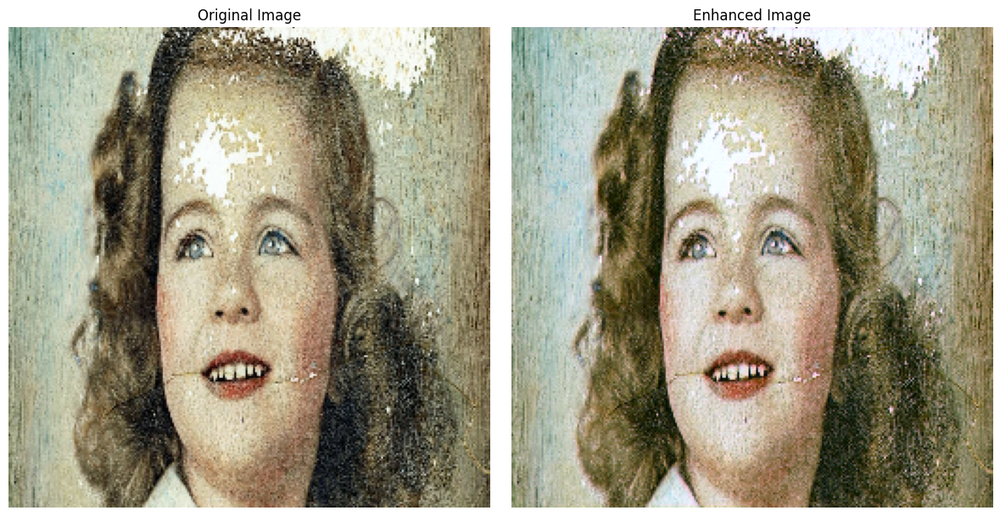

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/baby.jpeg"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)

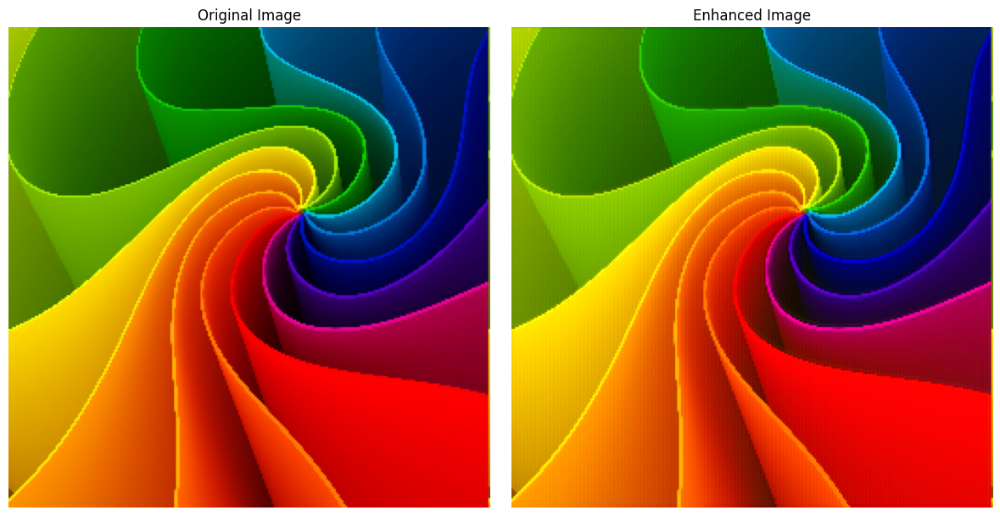

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/colour .jpg"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)

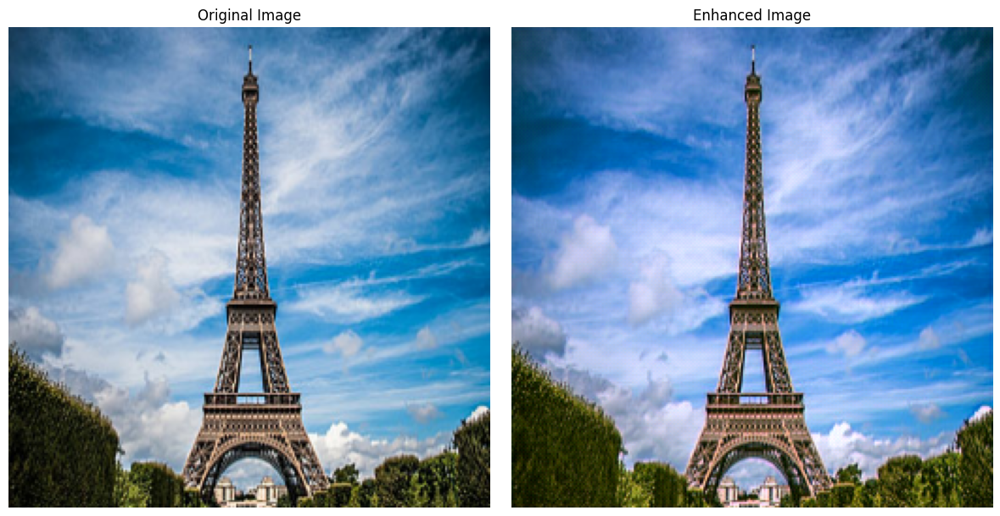

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/2.jpg"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)

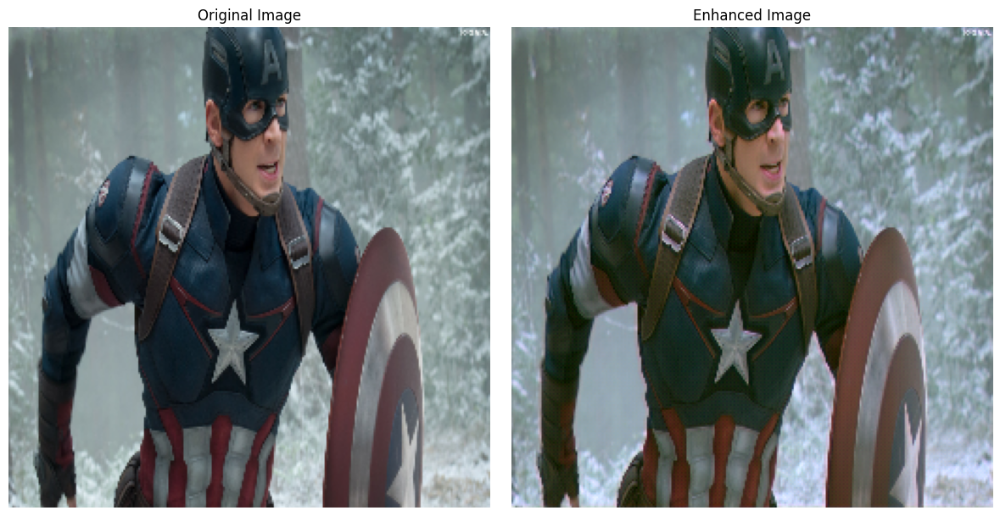

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/image.jpg"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)

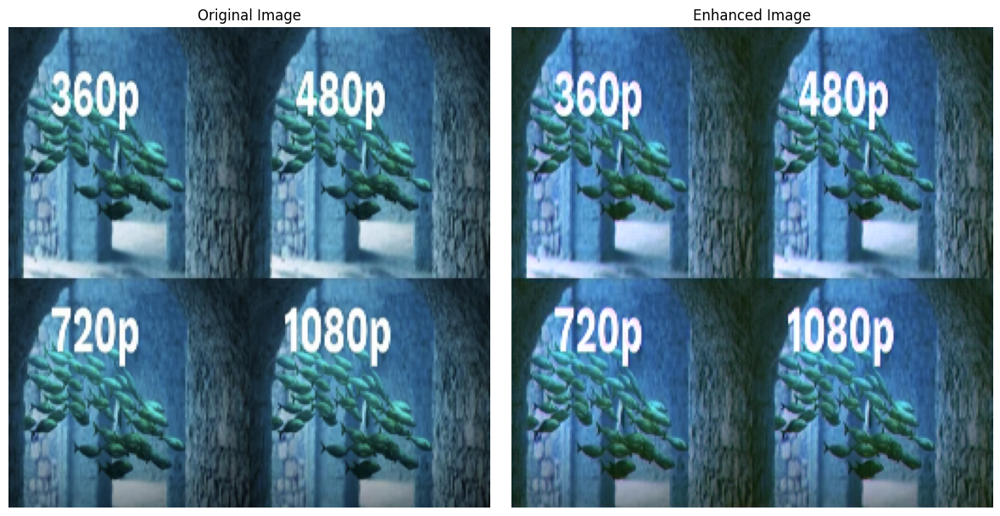

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/res.png"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)

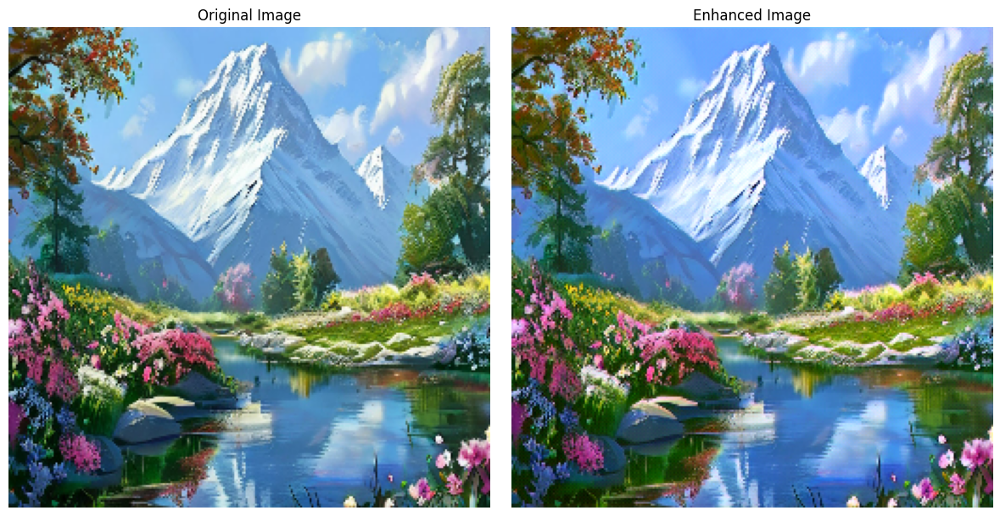

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/mt.jpeg"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)

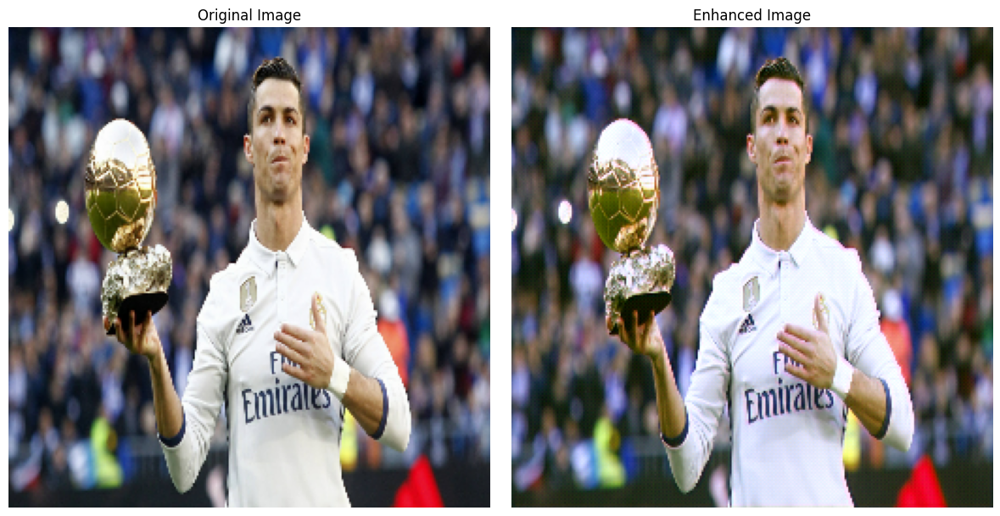

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/ronaldo-cristiano-2017-real-madrid-ballon-d-or-2016-0026751808hjpg-1698686328-120749.jpg"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)

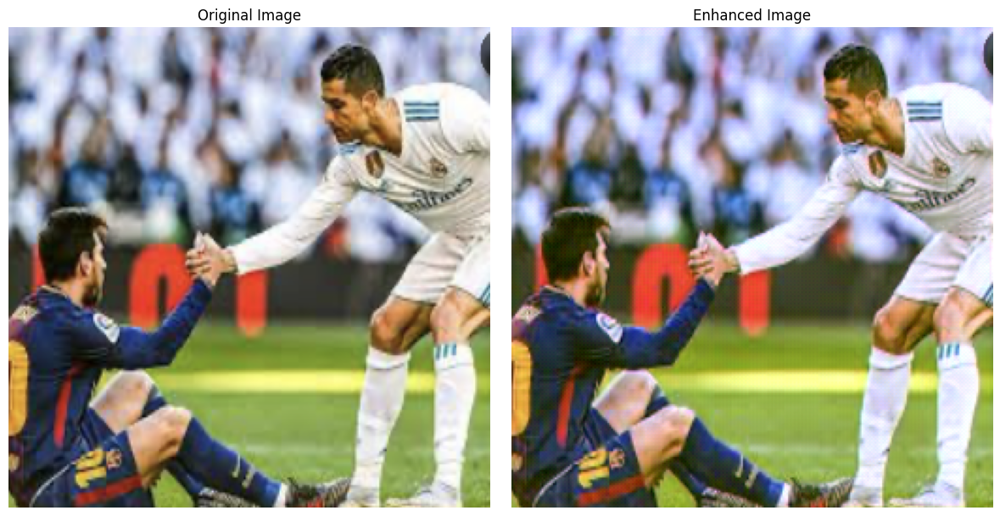

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Function to load and preprocess the image
def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [256, 256])
    return img

# Load and process the input image
input_image_path = "/content/M_R.png"  # Update this path to match your image file name
input_image = load_and_preprocess_image(input_image_path)
input_image = normalize(input_image)
input_image = tf.expand_dims(input_image, 0)

# Generate the enhanced image
enhanced_image = generator(input_image, training=False)

# Convert images back to displayable format
input_display = tf.clip_by_value(denormalize(input_image[0]), 0, 255).numpy().astype(np.uint8)
enhanced_display = tf.clip_by_value(denormalize(enhanced_image[0]), 0, 255).numpy().astype(np.uint8)

# Display both the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(input_display)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_display)
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the enhanced image
plt.imsave('enhanced_image.png', enhanced_display)